In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
path = f"gdrive/MyDrive/Mestrado/IA904/Weeds.v3-augmented_nottrained.tensorflow/"

Mounted at /content/gdrive


In [2]:
import os
import glob
import matplotlib.pyplot as plt
from PIL import Image
from collections import Counter, defaultdict
import numpy as np
import csv

# Funções

In [3]:
def show_images(folder_path, qtd=3):
    image_extensions = ('.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff')

    image_files = [file for file in os.listdir(folder_path) if file.lower().endswith(image_extensions)]

    qtd = min(qtd, len(image_files))

    plt.figure(figsize=(20, 10))

    for i in range(qtd):
        image_path = os.path.join(folder_path, image_files[i])
        image = Image.open(image_path)
        plt.subplot(1, qtd, i + 1)
        plt.imshow(image)
        plt.axis('off')

    plt.show()

In [15]:
def show_images_gray(images, qtd=3):
    qtd = min(qtd, len(images))

    plt.figure(figsize=(20, 10))

    for i in range(qtd):
        image = images[i]
        plt.subplot(1, qtd, i + 1)
        if image.mode == 'L':
            plt.imshow(image, cmap='gray')
        else:
            plt.imshow(image)
        plt.axis('off')

    plt.show()

In [4]:
def count_lines_in_file(file_path):
    with open(file_path, 'r') as file:
        return len(file.readlines())

In [5]:
def count_lines_in_csv(file_path):
    with open(file_path, newline='') as csvfile:
        reader = csv.reader(csvfile)
        line_counts = [sum(1 for row in reader)]
    return line_counts

In [6]:
def get_label_files_statistics(folder_path):
    csv_file_path = os.path.join(folder_path, '_annotations.csv')
    if not os.path.exists(csv_file_path):
        print(f"O arquivo {csv_file_path} não foi encontrado.")
        return

    image_line_counts = defaultdict(int)

    with open(csv_file_path, newline='') as csvfile:
        reader = csv.reader(csvfile)
        for row in reader:
            if row:
                image_name = row[0]
                image_line_counts[image_name] += 1

    line_counts = list(image_line_counts.values())
    line_count_stats = Counter(line_counts)

    total_files = len(line_counts)
    total_lines = sum(line_counts)
    average_lines_per_file = total_lines / total_files if total_files > 0 else 0
    min_lines_in_file = min(line_counts) if total_files > 0 else 0
    max_lines_in_file = max(line_counts) if total_files > 0 else 0

    for line_count, occurrence in sorted(line_count_stats.items()):
        print(f"  {line_count} lines: {occurrence} files")

    print(f"\n  Total files: {total_files}")
    print(f"  Total lines: {total_lines}")
    print(f"  Average lines per file: {average_lines_per_file:.2f}")
    print(f"  Min lines in a file: {min_lines_in_file}")
    print(f"  Max lines in a file: {max_lines_in_file}")

In [7]:
def get_image_statistics(folder_path):
    images_dir = os.path.join(folder_path)
    widths, heights = [], []
    n_grayscale, n_color, sampled_pixels = 0, 0, []

    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff')

    for image_file in os.listdir(images_dir):
        if not image_file.lower().endswith(valid_extensions):
            continue

        image_path = os.path.join(images_dir, image_file)
        try:
            image = Image.open(image_path)
        except IOError:
            print(f"Error opening {image_file}, skipping.")
            continue

        image_array = np.array(image)

        if len(image_array.shape) == 2:
            n_grayscale += 1
            sampled_pixels.extend(image_array.ravel()[::100])
        else:
            n_color += 1
            for channel in range(3):
                sampled_pixels.extend(image_array[:, :, channel].ravel()[::100])

        widths.append(image.width)
        heights.append(image.height)

    if not widths or not heights:
        print(f"No valid images found in {os.path.basename(folder_path)}")
        return

    mean_width, std_width = np.mean(widths), np.std(widths)
    mean_height, std_height = np.mean(heights), np.std(heights)

    print(f"\nGeneral statistics for {os.path.basename(folder_path)}:")
    print(f"  Mean image width: {mean_width:.2f} - Std: {std_width:.2f}")
    print(f"  Mean image height: {mean_height:.2f} - Std: {std_height:.2f}")
    print(f"  Number of grayscale images: {n_grayscale}")
    print(f"  Number of color images: {n_color}")

    hist, bins = np.histogram(sampled_pixels, bins=256, range=(0, 255))
    hist = hist / hist.sum() * 100

    plt.figure(figsize=(10, 4))
    plt.hist(bins[:-1], bins, weights=hist, histtype='step', color='black')
    plt.title(f"Combined Histogram for {os.path.basename(folder_path)}")
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency (%)')
    plt.show()

In [12]:
def get_image_statistics_gray(images):
    widths, heights = [], []
    n_grayscale, n_color, sampled_pixels = 0, 0, []

    for image in images:
        try:
            image_array = np.array(image)
        except Exception as e:
            print(f"Error processing image, skipping. Error: {e}")
            continue

        if len(image_array.shape) == 2:
            n_grayscale += 1
            sampled_pixels.extend(image_array.ravel()[::100])
        else:
            n_color += 1
            for channel in range(3):
                sampled_pixels.extend(image_array[:, :, channel].ravel()[::100])

        widths.append(image.width)
        heights.append(image.height)

    if not widths or not heights:
        print(f"No valid images found.")
        return

    mean_width, std_width = np.mean(widths), np.std(widths)
    mean_height, std_height = np.mean(heights), np.std(heights)

    print(f"\nGeneral statistics:")
    print(f"  Mean image width: {mean_width:.2f} - Std: {std_width:.2f}")
    print(f"  Mean image height: {mean_height:.2f} - Std: {std_height:.2f}")
    print(f"  Number of grayscale images: {n_grayscale}")
    print(f"  Number of color images: {n_color}")

    hist, bins = np.histogram(sampled_pixels, bins=256, range=(0, 255))
    hist = hist / hist.sum() * 100

    plt.figure(figsize=(10, 4))
    plt.hist(bins[:-1], bins, weights=hist, histtype='step', color='black')
    plt.title(f"Combined Histogram")
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency (%)')
    plt.show()

In [8]:
def process_directory(path,title,route):
    print(title)
    show_images(os.path.join(path, route))
    get_label_files_statistics(os.path.join(path, route))
    get_image_statistics(os.path.join(path, route))

In [9]:
def convert_to_gray(dir):
    gray_img = []
    ext = {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff'}

    for file in os.listdir(dir):
        path = os.path.join(dir, file)
        if os.path.isfile(path) and os.path.splitext(file)[1].lower() in ext:
            try:
                img = Image.open(path)
                img_gray = img.convert('L')
                gray_img.append(img_gray)
            except Exception as e:
                print(f"Erro ao processar {file}: {e}")

    return gray_img

# Aplicação - Todas Imagens - RGB

Originais - Test


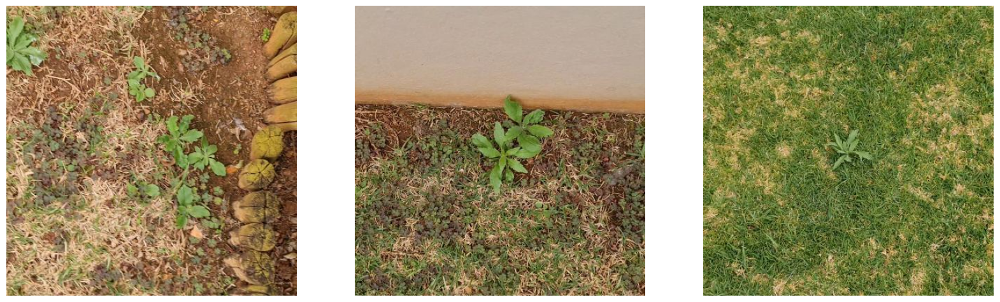

  1 lines: 84 files
  2 lines: 36 files
  3 lines: 18 files
  4 lines: 19 files
  5 lines: 5 files
  6 lines: 3 files
  7 lines: 3 files
  8 lines: 4 files
  9 lines: 2 files
  10 lines: 1 files
  11 lines: 2 files
  12 lines: 1 files
  13 lines: 3 files

  Total files: 181
  Total lines: 483
  Average lines per file: 2.67
  Min lines in a file: 1
  Max lines in a file: 13

General statistics for test:
  Mean image width: 416.00 - Std: 0.00
  Mean image height: 416.00 - Std: 0.00
  Number of grayscale images: 0
  Number of color images: 180


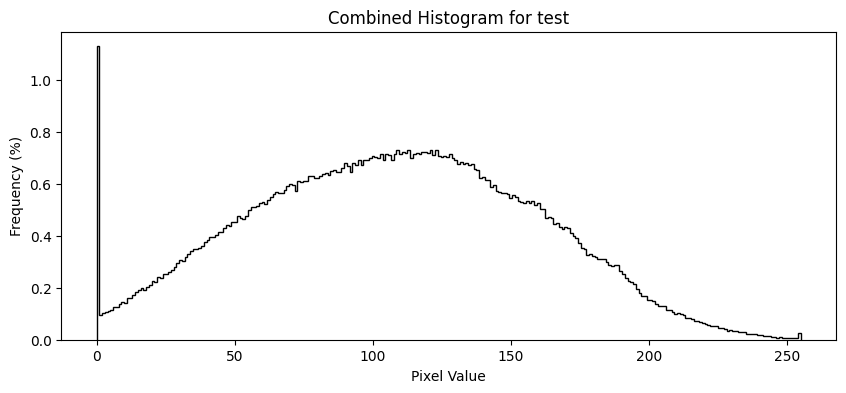

In [ ]:
process_directory(path,"Originais - Test","originais/test")

Originais - Train


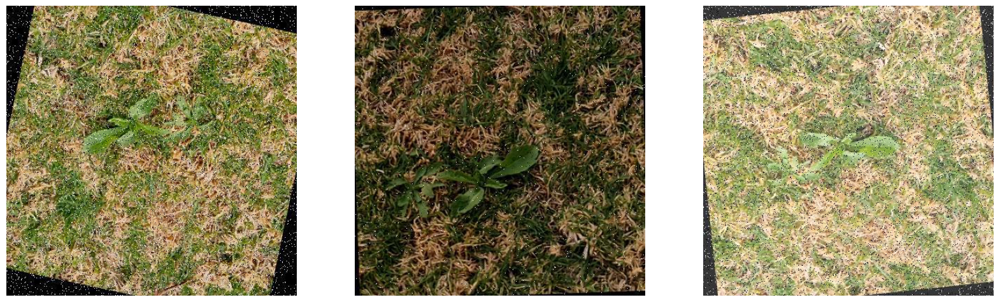

  1 lines: 1832 files
  2 lines: 686 files
  3 lines: 290 files
  4 lines: 215 files
  5 lines: 161 files
  6 lines: 105 files
  7 lines: 76 files
  8 lines: 96 files
  9 lines: 44 files
  10 lines: 52 files
  11 lines: 21 files
  12 lines: 24 files
  13 lines: 22 files
  14 lines: 25 files
  15 lines: 12 files
  16 lines: 4 files

  Total files: 3665
  Total lines: 9984
  Average lines per file: 2.72
  Min lines in a file: 1
  Max lines in a file: 16

General statistics for train:
  Mean image width: 416.00 - Std: 0.00
  Mean image height: 416.00 - Std: 0.00
  Number of grayscale images: 0
  Number of color images: 3664


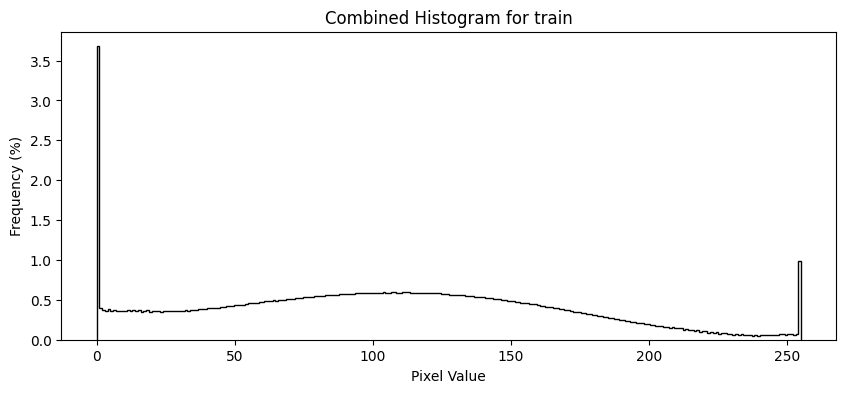

In [ ]:
process_directory(path,"Originais - Train","originais/train")

Originais - Valid


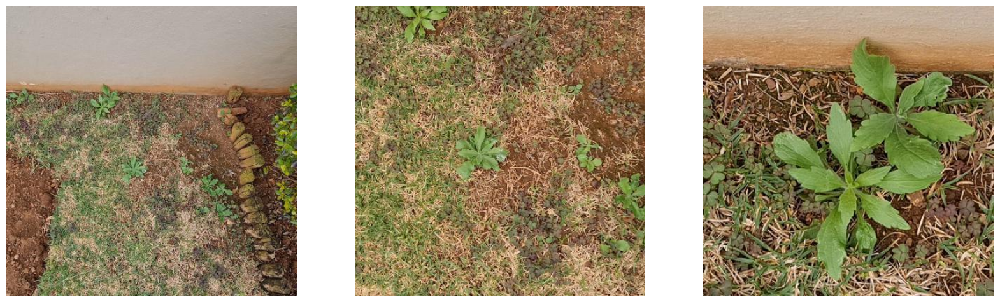

  1 lines: 169 files
  2 lines: 78 files
  3 lines: 32 files
  4 lines: 26 files
  5 lines: 22 files
  6 lines: 8 files
  7 lines: 6 files
  8 lines: 6 files
  9 lines: 3 files
  10 lines: 1 files
  11 lines: 4 files
  12 lines: 2 files
  13 lines: 1 files
  14 lines: 1 files
  16 lines: 1 files

  Total files: 360
  Total lines: 921
  Average lines per file: 2.56
  Min lines in a file: 1
  Max lines in a file: 16

General statistics for valid:
  Mean image width: 416.00 - Std: 0.00
  Mean image height: 416.00 - Std: 0.00
  Number of grayscale images: 0
  Number of color images: 359


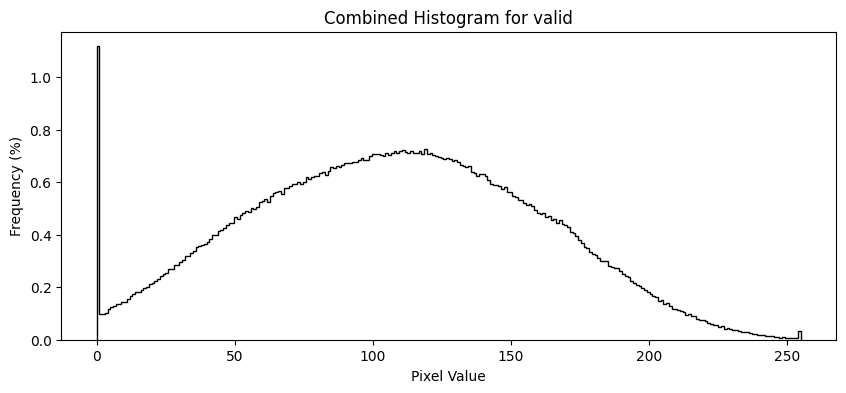

In [ ]:
process_directory(path,"Originais - Valid","originais/valid")

Processadas - Test

General statistics for test:
  Mean image width: 416.00 - Std: 0.00
  Mean image height: 416.00 - Std: 0.00
  Number of grayscale images: 0
  Number of color images: 180


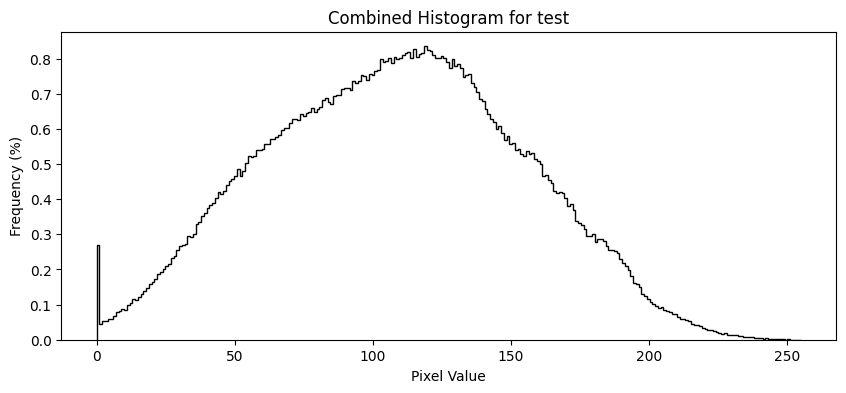

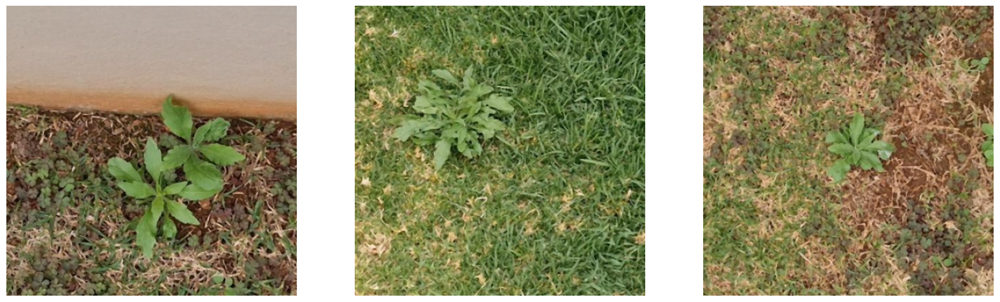

In [ ]:
print("Processadas - Test")
get_image_statistics(os.path.join(path, "processadas/test"))
print("\n")
show_images(os.path.join(path, "processadas/test"))

Processadas - Train

General statistics for train:
  Mean image width: 416.00 - Std: 0.00
  Mean image height: 416.00 - Std: 0.00
  Number of grayscale images: 0
  Number of color images: 3664


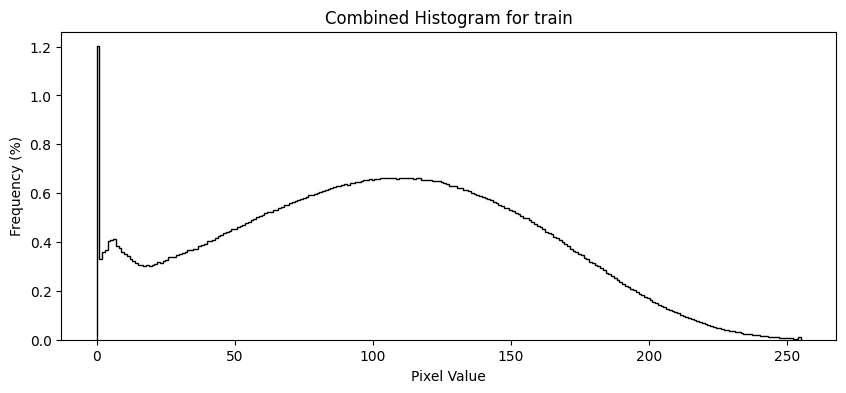

/n


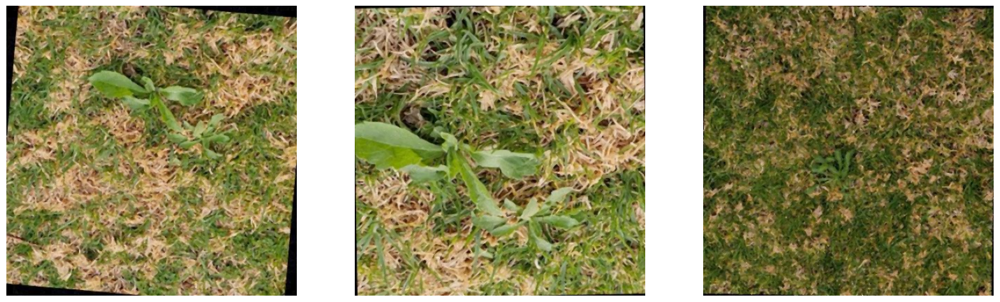

In [ ]:
print("Processadas - Train")
get_image_statistics(os.path.join(path, "processadas/train"))
print("/n")
show_images(os.path.join(path, "processadas/train"))

Processadas - valid

General statistics for valid:
  Mean image width: 416.00 - Std: 0.00
  Mean image height: 416.00 - Std: 0.00
  Number of grayscale images: 0
  Number of color images: 359


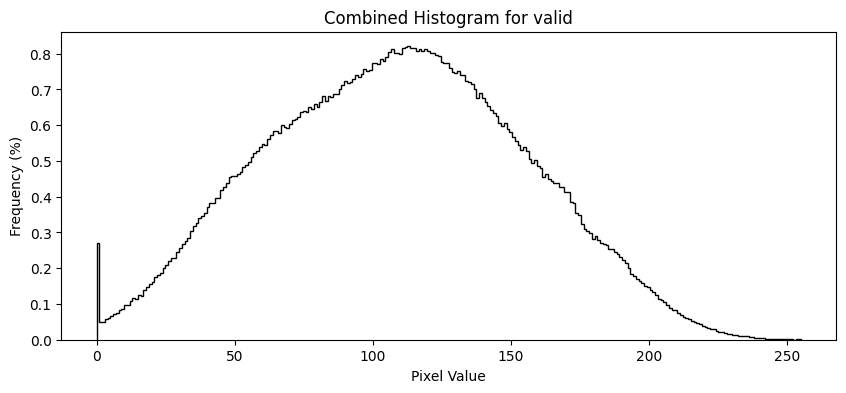

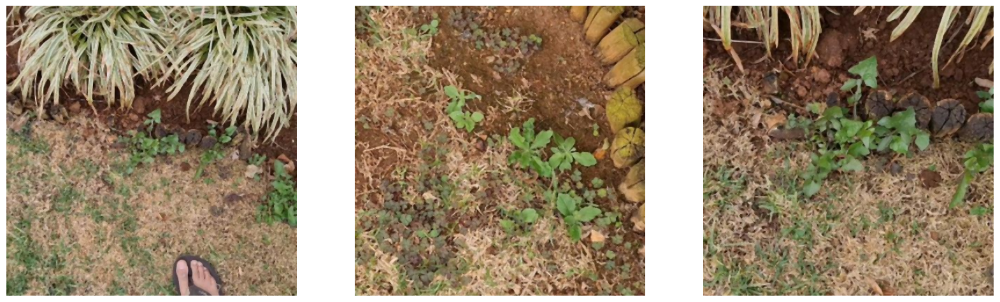

In [ ]:
print("Processadas - valid")
get_image_statistics(os.path.join(path, "processadas/valid"))
print("\n")
show_images(os.path.join(path, "processadas/valid"))

# Aplicando - Todas Imagens - Cinza

In [10]:
imgs_gray_test = convert_to_gray(path + "originais/test")
imgs_gray_train = convert_to_gray(path + "originais/train")
imgs_gray_valid = convert_to_gray(path + "originais/valid")

imgs_gray_test_process = convert_to_gray(path + "processadas/test")
imgs_gray_train_process = convert_to_gray(path + "processadas/train")
imgs_gray_valid_process = convert_to_gray(path + "processadas/valid")

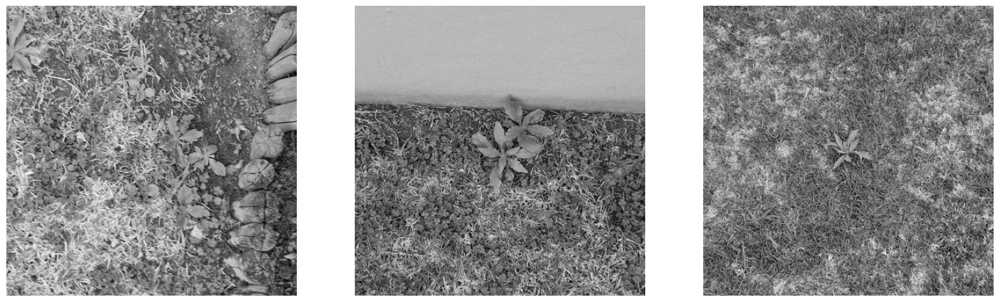


General statistics:
  Mean image width: 416.00 - Std: 0.00
  Mean image height: 416.00 - Std: 0.00
  Number of grayscale images: 180
  Number of color images: 0


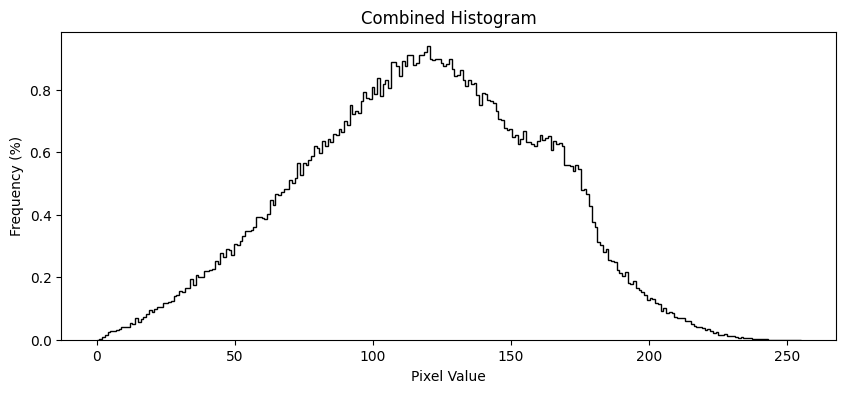

In [16]:
show_images_gray(imgs_gray_test, 3)
get_image_statistics_gray(imgs_gray_test)

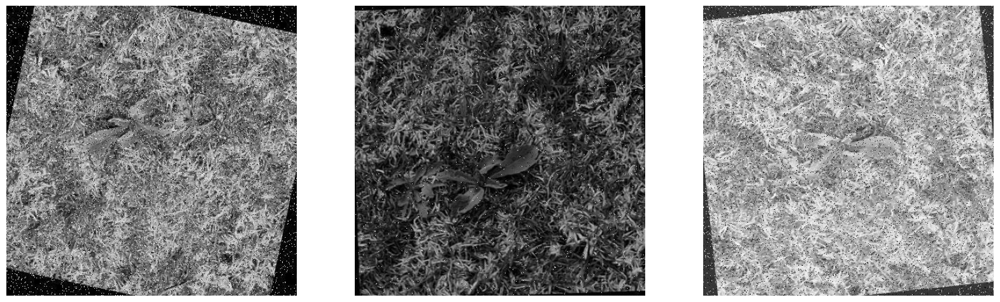


General statistics:
  Mean image width: 416.00 - Std: 0.00
  Mean image height: 416.00 - Std: 0.00
  Number of grayscale images: 3664
  Number of color images: 0


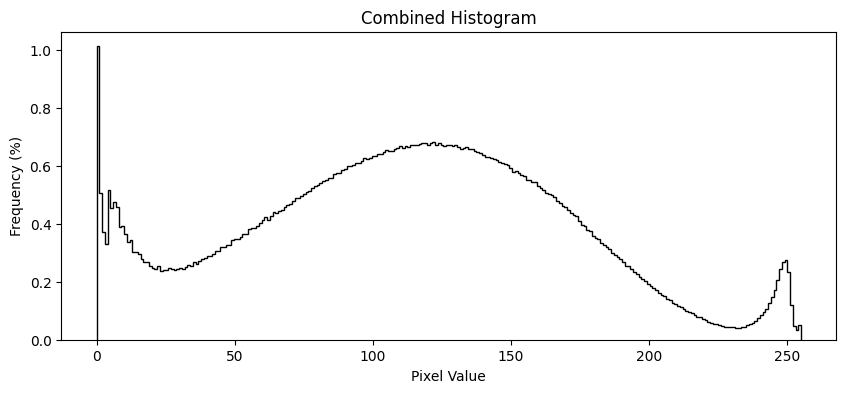

In [17]:
show_images_gray(imgs_gray_train, 3)
get_image_statistics_gray(imgs_gray_train)

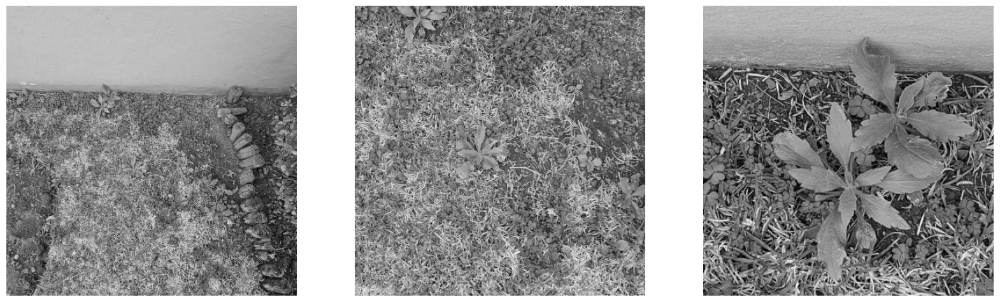


General statistics:
  Mean image width: 416.00 - Std: 0.00
  Mean image height: 416.00 - Std: 0.00
  Number of grayscale images: 359
  Number of color images: 0


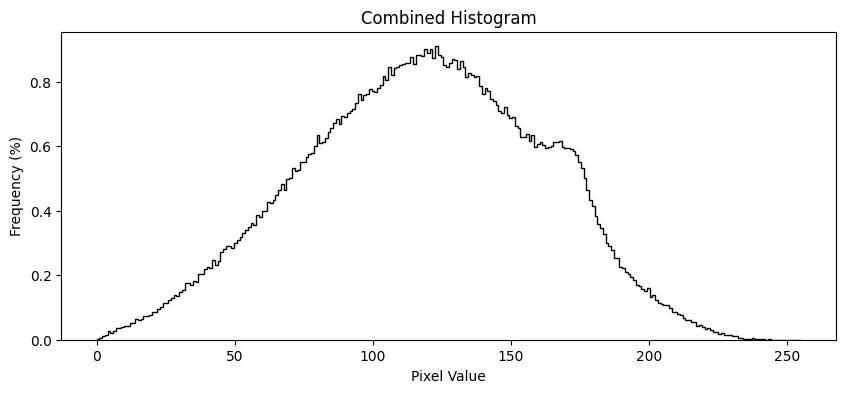

In [18]:
show_images_gray(imgs_gray_valid, 3)
get_image_statistics_gray(imgs_gray_valid)

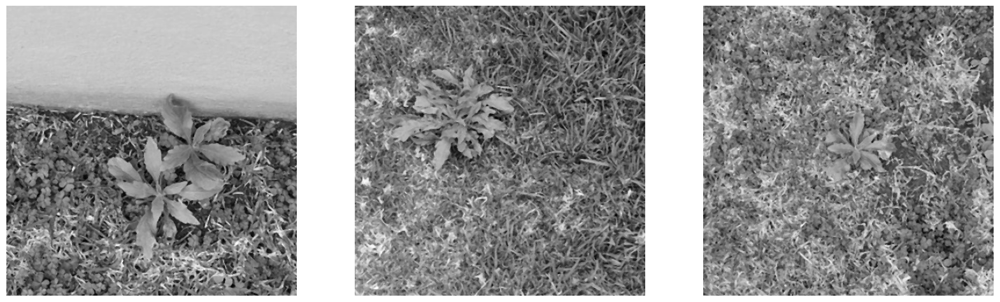


General statistics:
  Mean image width: 416.00 - Std: 0.00
  Mean image height: 416.00 - Std: 0.00
  Number of grayscale images: 180
  Number of color images: 0


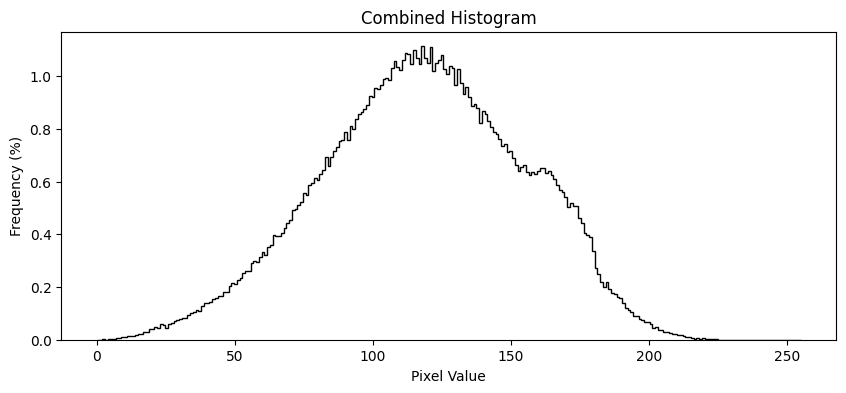

In [19]:
show_images_gray(imgs_gray_test_process, 3)
get_image_statistics_gray(imgs_gray_test_process)

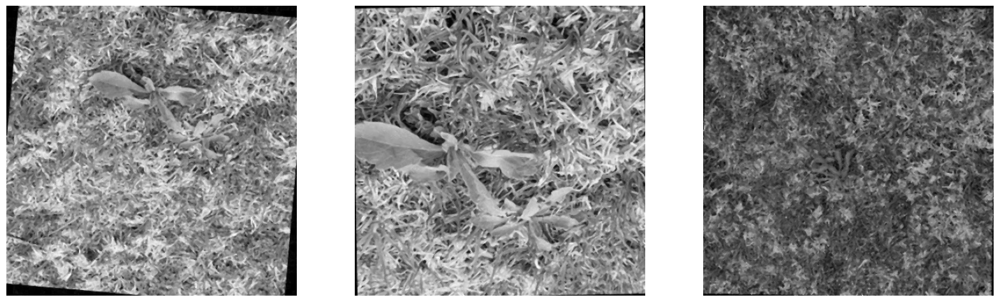


General statistics:
  Mean image width: 416.00 - Std: 0.00
  Mean image height: 416.00 - Std: 0.00
  Number of grayscale images: 3664
  Number of color images: 0


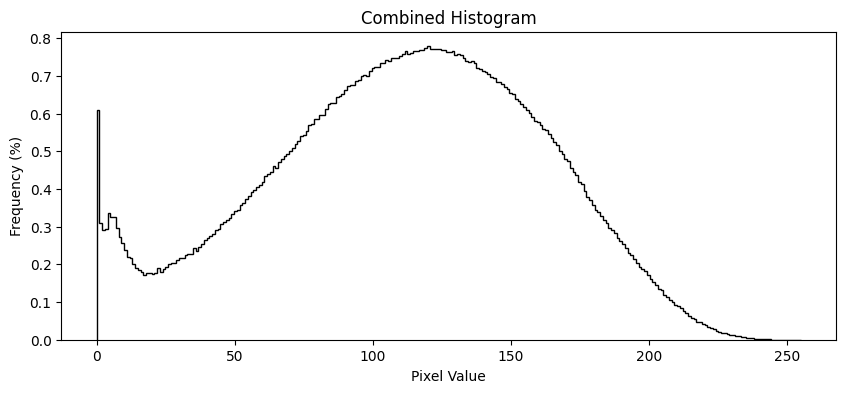

In [20]:
show_images_gray(imgs_gray_train_process, 3)
get_image_statistics_gray(imgs_gray_train_process)

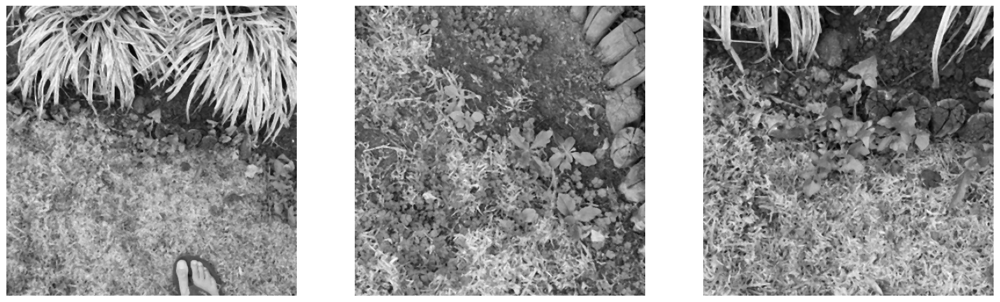


General statistics:
  Mean image width: 416.00 - Std: 0.00
  Mean image height: 416.00 - Std: 0.00
  Number of grayscale images: 359
  Number of color images: 0


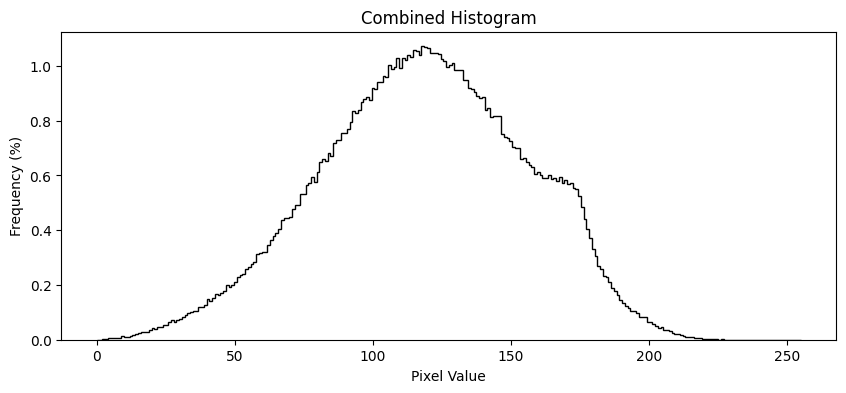

In [21]:
show_images_gray(imgs_gray_valid_process, 3)
get_image_statistics_gray(imgs_gray_valid_process)

# 30% da imagens

In [ ]:
print("test")
get_label_files_statistics(os.path.join(path, "originais/30PdoTotal/test30"))

test
  1 lines: 23 files
  2 lines: 10 files
  3 lines: 6 files
  4 lines: 8 files
  5 lines: 2 files
  6 lines: 2 files
  7 lines: 1 files
  8 lines: 1 files
  10 lines: 1 files
  11 lines: 1 files

  Total files: 55
  Total lines: 151
  Average lines per file: 2.75
  Min lines in a file: 1
  Max lines in a file: 11


In [ ]:
print("train")
get_label_files_statistics(os.path.join(path, "originais/30PdoTotal/train30"))

train
  1 lines: 566 files
  2 lines: 206 files
  3 lines: 74 files
  4 lines: 61 files
  5 lines: 46 files
  6 lines: 34 files
  7 lines: 23 files
  8 lines: 33 files
  9 lines: 11 files
  10 lines: 17 files
  11 lines: 5 files
  12 lines: 5 files
  13 lines: 5 files
  14 lines: 6 files
  15 lines: 6 files
  16 lines: 2 files

  Total files: 1100
  Total lines: 2958
  Average lines per file: 2.69
  Min lines in a file: 1
  Max lines in a file: 16


In [ ]:
print("valid")
get_label_files_statistics(os.path.join(path, "originais/30PdoTotal/valid30"))

valid
  1 lines: 49 files
  2 lines: 25 files
  3 lines: 11 files
  4 lines: 4 files
  5 lines: 6 files
  6 lines: 3 files
  7 lines: 1 files
  8 lines: 3 files
  9 lines: 1 files
  10 lines: 1 files
  11 lines: 1 files
  12 lines: 1 files
  13 lines: 1 files
  16 lines: 1 files

  Total files: 108
  Total lines: 298
  Average lines per file: 2.76
  Min lines in a file: 1
  Max lines in a file: 16


# 10% da imagens

In [ ]:
print("test")
get_label_files_statistics(os.path.join(path, "originais/10PdoTotal/test10"))

test
  1 lines: 13 files
  2 lines: 1 files
  3 lines: 1 files
  4 lines: 2 files
  12 lines: 1 files
  13 lines: 1 files

  Total files: 19
  Total lines: 51
  Average lines per file: 2.68
  Min lines in a file: 1
  Max lines in a file: 13


In [ ]:
print("train")
get_label_files_statistics(os.path.join(path, "originais/10PdoTotal/train10"))

train
  1 lines: 189 files
  2 lines: 67 files
  3 lines: 31 files
  4 lines: 17 files
  5 lines: 14 files
  6 lines: 13 files
  7 lines: 11 files
  8 lines: 5 files
  9 lines: 6 files
  10 lines: 5 files
  11 lines: 2 files
  12 lines: 2 files
  13 lines: 3 files
  14 lines: 1 files
  15 lines: 1 files

  Total files: 367
  Total lines: 967
  Average lines per file: 2.63
  Min lines in a file: 1
  Max lines in a file: 15


In [ ]:
print("valid")
get_label_files_statistics(os.path.join(path, "originais/10PdoTotal/valid10"))

valid
  1 lines: 16 files
  2 lines: 10 files
  3 lines: 3 files
  4 lines: 2 files
  5 lines: 2 files
  6 lines: 1 files
  11 lines: 2 files

  Total files: 36
  Total lines: 91
  Average lines per file: 2.53
  Min lines in a file: 1
  Max lines in a file: 11


# Bound Box unico

In [ ]:
print("test")
get_label_files_statistics(os.path.join(path, "originais/SingleWeed/test"))

test
  1 lines: 84 files

  Total files: 84
  Total lines: 84
  Average lines per file: 1.00
  Min lines in a file: 1
  Max lines in a file: 1


In [ ]:
print("train")
get_label_files_statistics(os.path.join(path, "originais/SingleWeed/train"))

train
  1 lines: 1832 files

  Total files: 1832
  Total lines: 1832
  Average lines per file: 1.00
  Min lines in a file: 1
  Max lines in a file: 1


In [ ]:
print("valid")
get_label_files_statistics(os.path.join(path, "originais/SingleWeed/valid"))

valid
  1 lines: 169 files

  Total files: 169
  Total lines: 169
  Average lines per file: 1.00
  Min lines in a file: 1
  Max lines in a file: 1


# De 5 A 10 Bound Boxs

In [ ]:
print("test")
get_label_files_statistics(os.path.join(path, "originais/5_To10Weeds/test"))

test
  1 lines: 1 files
  5 lines: 5 files
  6 lines: 3 files
  7 lines: 3 files
  8 lines: 4 files
  9 lines: 2 files
  10 lines: 1 files

  Total files: 19
  Total lines: 125
  Average lines per file: 6.58
  Min lines in a file: 1
  Max lines in a file: 10


In [ ]:
print("train")
get_label_files_statistics(os.path.join(path, "originais/5_To10Weeds/train"))

train
  1 lines: 1 files
  5 lines: 161 files
  6 lines: 105 files
  7 lines: 76 files
  8 lines: 96 files
  9 lines: 44 files
  10 lines: 52 files

  Total files: 535
  Total lines: 3652
  Average lines per file: 6.83
  Min lines in a file: 1
  Max lines in a file: 10


In [ ]:
print("valid")
get_label_files_statistics(os.path.join(path, "originais/5_To10Weeds/valid"))

valid
  1 lines: 1 files
  5 lines: 22 files
  6 lines: 8 files
  7 lines: 6 files
  8 lines: 6 files
  9 lines: 3 files
  10 lines: 1 files

  Total files: 47
  Total lines: 286
  Average lines per file: 6.09
  Min lines in a file: 1
  Max lines in a file: 10
